In [1]:
# Необходимо для корректной работы внешних .py файлов
%load_ext autoreload
%autoreload 2

In [2]:
import numpy as np
import pandas as pd
from sklearn.model_selection import train_test_split, GridSearchCV, KFold
from sklearn.compose import ColumnTransformer
from imblearn.pipeline import Pipeline
from lightgbm import LGBMRegressor
from sklearn.preprocessing import OneHotEncoder
from helper import *
from plots import *
from timeit import default_timer as timer
import random
from scipy.stats import randint as sp_randint
from scipy.stats import uniform as sp_uniform
from skopt.space import Integer, Real, Categorical
from skopt import BayesSearchCV

In [3]:
# фиксируем состояние генератора псевдослучайных чисел. Это необходимо, чтобы результаты модели не менялись с каждым новым запуском 
SEED = 42 # можно указать любое число
np.random.seed(SEED)
random.seed(SEED)

In [4]:
df = pd.read_csv("diamonds.csv")

## 1. Предобработка

In [5]:
# Общие преобразования
df_preprocessed = df.copy()

In [6]:
df_preprocessed = df_preprocessed.drop(columns=['Unnamed: 0'])

In [7]:
# удалим строки с нулевыми значениями x,y или z
df_preprocessed = df_preprocessed.query("~(x == 0) & ~(y == 0) & ~(z == 0)")

In [8]:
X, y = divide_data(df_preprocessed, 'price')
X_train, X_test, y_train, y_test = train_test_split(X, y, test_size=0.2, random_state=SEED)

In [9]:
categorical_cols = ['cut', 'color', 'clarity']
numeric_cols = ['carat', 'depth', 'table', 'x', 'y', 'z']

In [10]:
# Создаем предобработчик данных в виде последовательного Pipeline
preprocessor = Pipeline([
    ('transformations', ColumnTransformer(
        [('encoder', OneHotEncoder(sparse_output=False, handle_unknown='ignore'), categorical_cols)],
        remainder='passthrough',  # числовые колонки передаются без изменений
        verbose_feature_names_out=False
    ))
])

# Устанавливаем вывод в формате pandas DataFrame (для sklearn версии 1.0 и выше)
preprocessor.set_output(transform="pandas")

Pipeline(steps=[('transformations',
                 ColumnTransformer(remainder='passthrough',
                                   transformers=[('encoder',
                                                  OneHotEncoder(handle_unknown='ignore',
                                                                sparse_output=False),
                                                  ['cut', 'color', 'clarity'])],
                                   verbose_feature_names_out=False))])

In [11]:
base_model = ('LGBMRegressor', LGBMRegressor(random_state=SEED))

In [12]:
preprocessor.steps.append(base_model)
pipeline = preprocessor

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000614 seconds.
You can set `force_col_wise=true` to remove the overhead.
[LightGBM] [Info] Total Bins 1295
[LightGBM] [Info] Number of data points in the train set: 43136, number of used features: 26
[LightGBM] [Info] Start training from score 3926.531459


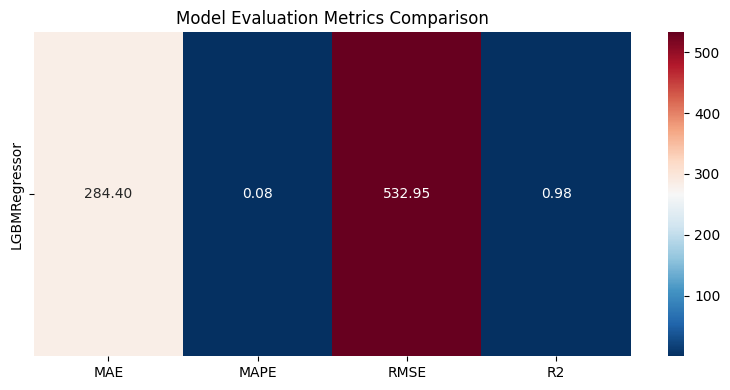

In [13]:
initial_metrics = train_evaluate_models_reg(
    models=[('LGBMRegressor', pipeline)],
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    seed=SEED
)

In [14]:
initial_metrics

,MAE,MAPE,RMSE,R2
LGBMRegressor,284.403364,0.083826,532.951096,0.982283


## 2. Подбор гиперпараметров

In [15]:
cv = KFold(n_splits=5, shuffle=True, random_state=SEED)

In [20]:
param_grid = {
    # Контроль сложности модели и переобучения
    "LGBMRegressor__num_leaves": [7, 15, 31],  # Максимальное количество листьев в дереве (влияет на сложность модели)
    "LGBMRegressor__max_depth": [3, 5, 7],     # Максимальная глубина дерева (ограничивает сложность)
    "LGBMRegressor__min_child_samples": [5, 10, 20],  # Минимальное количество данных в листе (контроль переобучения)
    
    # Скорость обучения и количество итераций бустинга
    "LGBMRegressor__learning_rate": [0.01, 0.05, 0.1],  # Скорость обучения (шаг градиентного спуска)
    "LGBMRegressor__n_estimators": [10, 20, 30, 40, 50, 100, 200],  # Количество деревьев в ансамбле
    
    # Регуляризация
    # "LGBMClassifier__reg_alpha": [0, 0.1, 1],   # L1-регуляризация (лассо)
    "LGBMRegressor__reg_lambda": [0, 0.1, 1],  # L2-регуляризация (ридж)
    
    # Сэмплирование признаков
    # "LGBMClassifier__feature_fraction": [0.7, 0.9, 1.0],  # Доля признаков для использования при построении каждого дерева
    # "LGBMClassifier__bagging_fraction": [0.7, 0.9],       # Доля данных для использования в каждом бустинговом раунде
    # "LGBMClassifier__bagging_freq": [0, 1],               # Частота бэггинга (0 - отключен)
    
    # # Другие параметры
    # "LGBMClassifier__subsample": [0.8, 1.0],               # Доля случайных примеров для обучения каждого дерева
    # "LGBMClassifier__colsample_bytree": [0.7, 0.9, 1.0],   # Доля признаков для каждого дерева
}

grid_search = GridSearchCV(
    estimator=pipeline,
    param_grid=param_grid,
    scoring='neg_mean_absolute_error',
    cv=cv,
    n_jobs=1,
    verbose=3
)

In [21]:
grid_search_start = timer()
grid_search.fit(X_train, y_train)
grid_search_end = timer()

Fitting 5 folds for each of 1701 candidates, totalling 8505 fits
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000153 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1284
[LightGBM] [Info] Number of data points in the train set: 34508, number of used features: 26
[LightGBM] [Info] Start training from score 3939.849571
[CV 1/5] END LGBMRegressor__learning_rate=0.01, LGBMRegressor__max_depth=3, LGBMRegressor__min_child_samples=5, LGBMRegressor__n_estimators=10, LGBMRegressor__num_leaves=7, LGBMRegressor__reg_lambda=0;, score=-2764.882 total time=   0.0s
[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing col-wise multi-threading, the overhead of testing was 0.000473 seconds.
You can set `force_col_w

In [23]:
print(f"Total time: {grid_search_end - grid_search_start:.2f} seconds")

Total time: 681.08 seconds


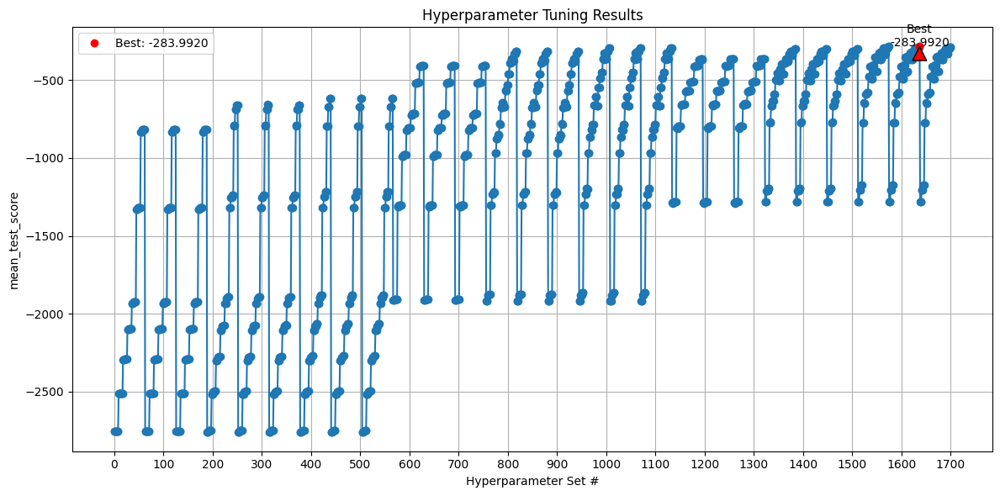

In [24]:
data = plot_hyperparam_search_results(grid_search.cv_results_, xtick_step=100)

In [25]:
grid_search.best_params_

{'LGBMRegressor__learning_rate': 0.1,
 'LGBMRegressor__max_depth': 7,
 'LGBMRegressor__min_child_samples': 10,
 'LGBMRegressor__n_estimators': 200,
 'LGBMRegressor__num_leaves': 31,
 'LGBMRegressor__reg_lambda': 1}

In [26]:
grid_search_best_model = grid_search.best_estimator_

[LightGBM] [Warning] Found whitespace in feature_names, replace with underlines
[LightGBM] [Info] Auto-choosing row-wise multi-threading, the overhead of testing was 0.000181 seconds.
You can set `force_row_wise=true` to remove the overhead.
And if memory is not enough, you can set `force_col_wise=true`.
[LightGBM] [Info] Total Bins 1295
[LightGBM] [Info] Number of data points in the train set: 43136, number of used features: 26
[LightGBM] [Info] Start training from score 3926.531459
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, best gain: -inf
[LightGBM] [Warning] No further splits with positive gain, be

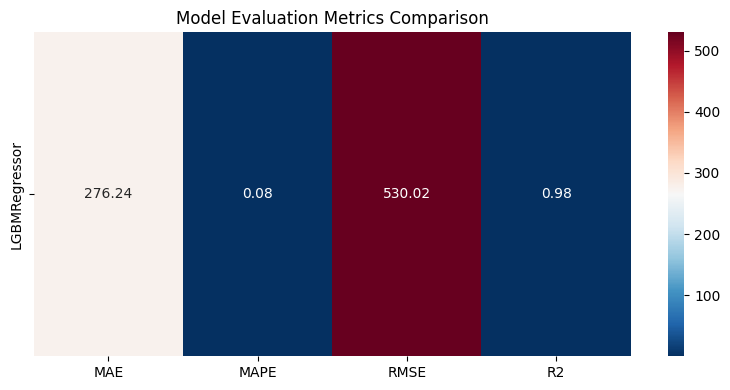

In [27]:
grid_search_metrics = train_evaluate_models_reg(
    models=[('LGBMRegressor', grid_search_best_model)],
    X_train=X_train,
    y_train=y_train,
    X_test=X_test,
    y_test=y_test,
    seed=SEED
)

In [28]:
grid_search_metrics

,MAE,MAPE,RMSE,R2
LGBMRegressor,276.244543,0.076109,530.024748,0.982477


(<Figure size 800x400 with 2 Axes>,
                     MAE      MAPE      RMSE        R2
 LGBMRegressor -8.158821 -0.007717 -2.926349  0.000194)

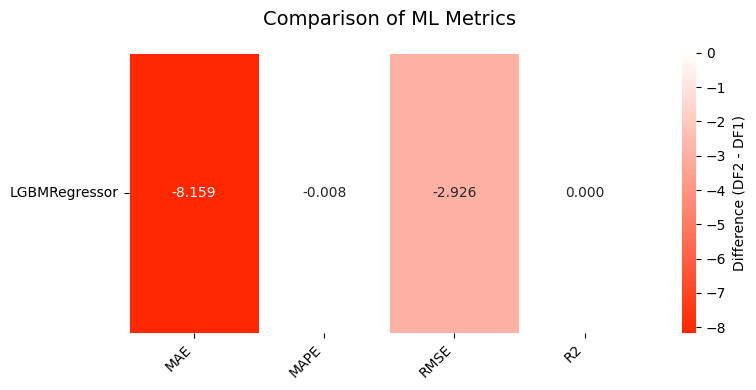

In [29]:
compare_metrics_heatmap(initial_metrics, grid_search_metrics)